# Test Trace, Corner, And FPD

Minimal notebook for reading one multimass HMC `.nc` file, plotting diagnostics, and computing `fpd_31`, `fpd_32`, `fpd_34`.

In [1]:
import os
os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'

import warnings
warnings.filterwarnings('ignore')

from pathlib import Path
import sys

import arviz as az
import corner
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['figure.constrained_layout.use'] = True

if str(Path.cwd()) not in sys.path:
    sys.path.append(str(Path.cwd()))


In [2]:
input_suffix = '_ss=2_full_light_multimass'
# cosmo_tag = 'desi_planck'  # or 'pantheonsh0es'
cosmo_tag = 'pantheonsh0es'  # or 'pantheonsh0es'
run_tag = '20260408_23'    # edit this
batch_idx = 3              # edit this

suffix_hmc = f"{input_suffix}_step6_{cosmo_tag}"
RUN_OUTPUT_DIR = Path('/mnt/lustre/tianli/quasar_hmc') / f'WFI2033{suffix_hmc}_{run_tag}'
NC_PATH = RUN_OUTPUT_DIR / f'WFI2033_{batch_idx}{suffix_hmc}.nc'

inf_data_pixel = az.from_netcdf(str(NC_PATH))
post = inf_data_pixel.posterior
num_chains = int(post.sizes['chain'])

print('NC_PATH =', NC_PATH)

NC_PATH = /mnt/lustre/tianli/quasar_hmc/WFI2033_ss=2_full_light_multimass_step6_pantheonsh0es_20260408_23/WFI2033_3_ss=2_full_light_multimass_step6_pantheonsh0es.nc


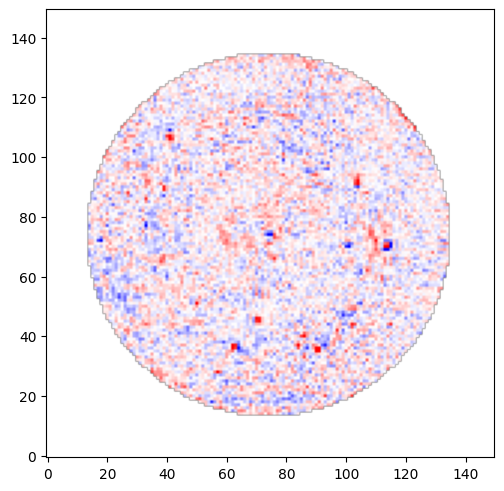

In [3]:
from astropy.io import fits
RESULT_DIR = Path(f'./result/result{'_ss=2_full_light_multimass'}_{'20260401_11'}')
DATA_SUB_PATH = RESULT_DIR / f'data_minus_lens_light{'_ss=2_full_light_multimass'}.fits'
data_subtracted = np.array(fits.getdata(DATA_SUB_PATH), dtype=float)
PRODUCTS_DIR = RESULT_DIR / 'data_products'
rms_file = np.array(fits.getdata(PRODUCTS_DIR / f'rms_with_psf_extra{'_ss=2_full_light_multimass'}.fits'), dtype=float)

MASK_OUT_PATH = './data/mask_out_center_r16.fits'
mask_out = np.array(fits.getdata(MASK_OUT_PATH), dtype=bool)
model_image = post.model_image.median(axis = 1)
plt.imshow(np.ma.array((data_subtracted - np.array(model_image[0,:,:]))/rms_file, mask=~mask_out), cmap = 'bwr', origin = 'lower', vmax = 3, vmin = -3)

In [4]:
div = inf_data_pixel.sample_stats['diverging']
print('diverging dims =', div.dims)
print('diverging shape =', div.shape)

if div.dims == ('chain', 'draw', 'diverging_dim_0'):
    div_counts = np.asarray(div.sum(dim='draw').values, dtype=int)
    print('divergences per chain:')
    print(f'  block 0 (main lens/source/cosmo/AGN): {div_counts[:, 0]}')
    print(f'  block 1 (psf correction): {div_counts[:, 1]}')
else:
    print('divergences per chain:')
    print(np.asarray(div.sum(dim='draw').values, dtype=int))


diverging dims = ('chain', 'draw')
diverging shape = (6, 1000)
divergences per chain:
[2 0 0 2 0 0]


In [5]:
vars_mass = [
    'm2l_ratio', 'm2l_ratio_slope',
    'kappa_s_halo', 'gammain_halo', 'e_halo',
    'Rs_halo', 'center_halo', 'gamma_sheer_halo',
    'theta_E_g1', 'theta_E_g2',# 'theta_E_g3', 'theta_E_g7',
]
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
vars_point_source = ['ra_ps', 'dec_ps', 'log10_amp_ps']
vars_cosmo = ['omega_m_cosmo', 'H0_cosmo', 'kappa_ext']
vars_delay = ['fpd_31', 'fpd_32', 'fpd_34', 'dt_31_days', 'dt_32_days', 'dt_34_days']

available_trace_vars = [
    name for name in (vars_mass + vars_power + vars_point_source + vars_cosmo + vars_delay)
    if name in post.data_vars
]

corner_vars_main = [
    name for name in (vars_mass + vars_cosmo)
    if name in post.data_vars
]

corner_vars_delay = [
    name for name in (vars_cosmo + vars_delay)
    if name in post.data_vars
]

print('trace vars =', available_trace_vars)
print('main corner vars =', corner_vars_main)
print('delay corner vars =', corner_vars_delay)


trace vars = ['m2l_ratio', 'm2l_ratio_slope', 'kappa_s_halo', 'gammain_halo', 'e_halo', 'Rs_halo', 'center_halo', 'gamma_sheer_halo', 'theta_E_g1', 'theta_E_g2', 'n_source_grid', 'rho_source_grid', 'sigma_source_grid', 'ra_ps', 'dec_ps', 'log10_amp_ps', 'omega_m_cosmo', 'H0_cosmo', 'kappa_ext', 'fpd_31', 'fpd_32', 'fpd_34', 'dt_31_days', 'dt_32_days', 'dt_34_days']
main corner vars = ['m2l_ratio', 'm2l_ratio_slope', 'kappa_s_halo', 'gammain_halo', 'e_halo', 'Rs_halo', 'center_halo', 'gamma_sheer_halo', 'theta_E_g1', 'theta_E_g2', 'omega_m_cosmo', 'H0_cosmo', 'kappa_ext']
delay corner vars = ['omega_m_cosmo', 'H0_cosmo', 'kappa_ext', 'fpd_31', 'fpd_32', 'fpd_34', 'dt_31_days', 'dt_32_days', 'dt_34_days']


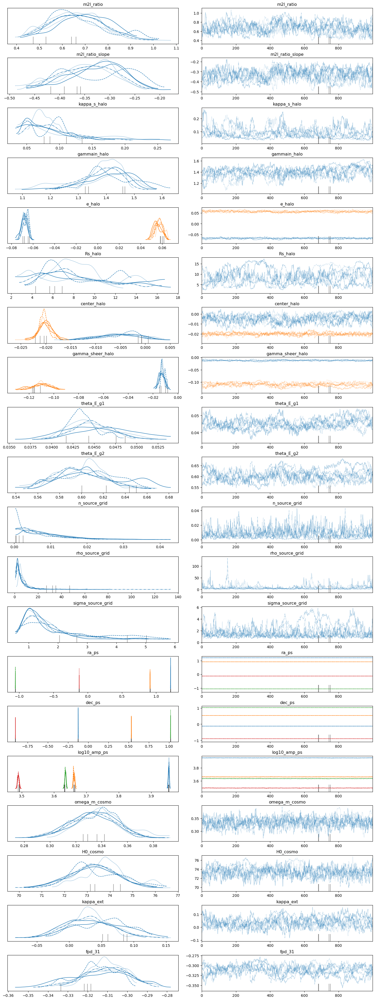

In [6]:
_ = az.plot_trace(
    inf_data_pixel,
    var_names=available_trace_vars,
    figsize=(14, max(8, 1.5 * len(available_trace_vars))),
    divergences=True,
)
plt.show()


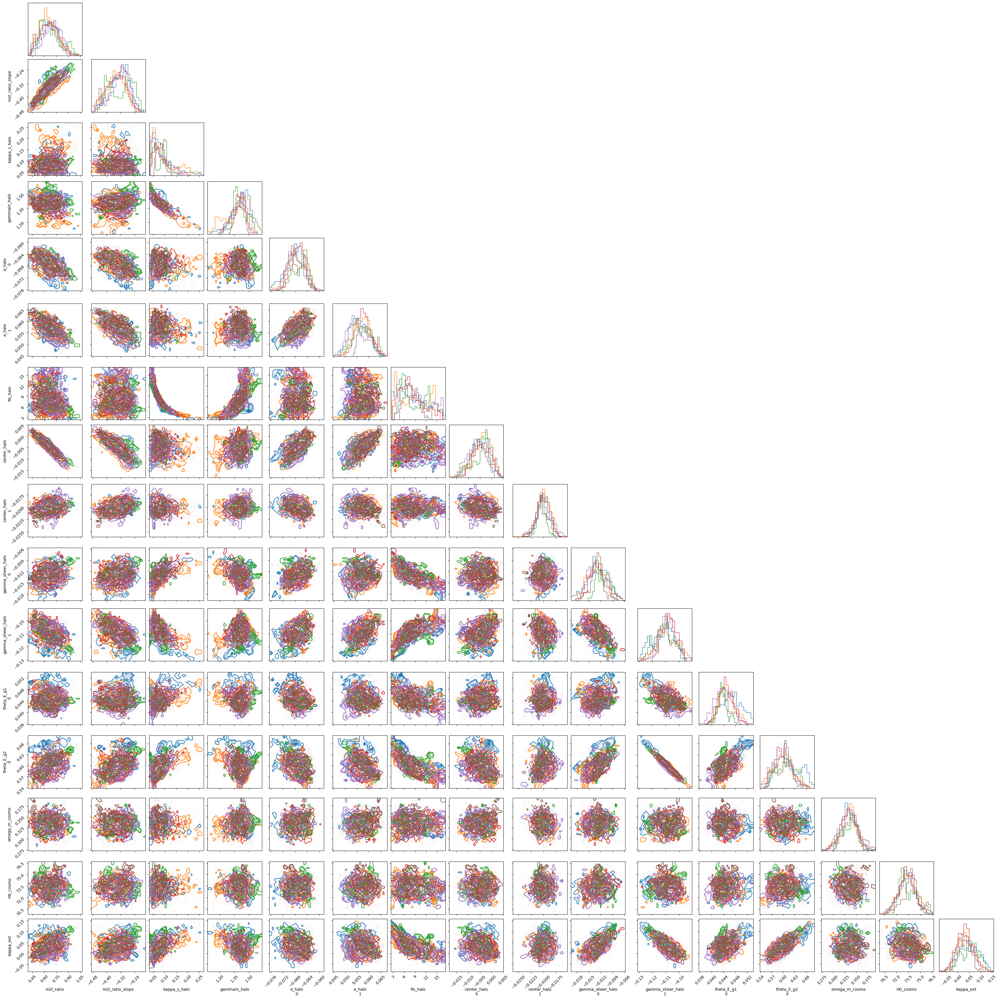

In [7]:
fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post.isel(chain=i),
        var_names=corner_vars_main,
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()


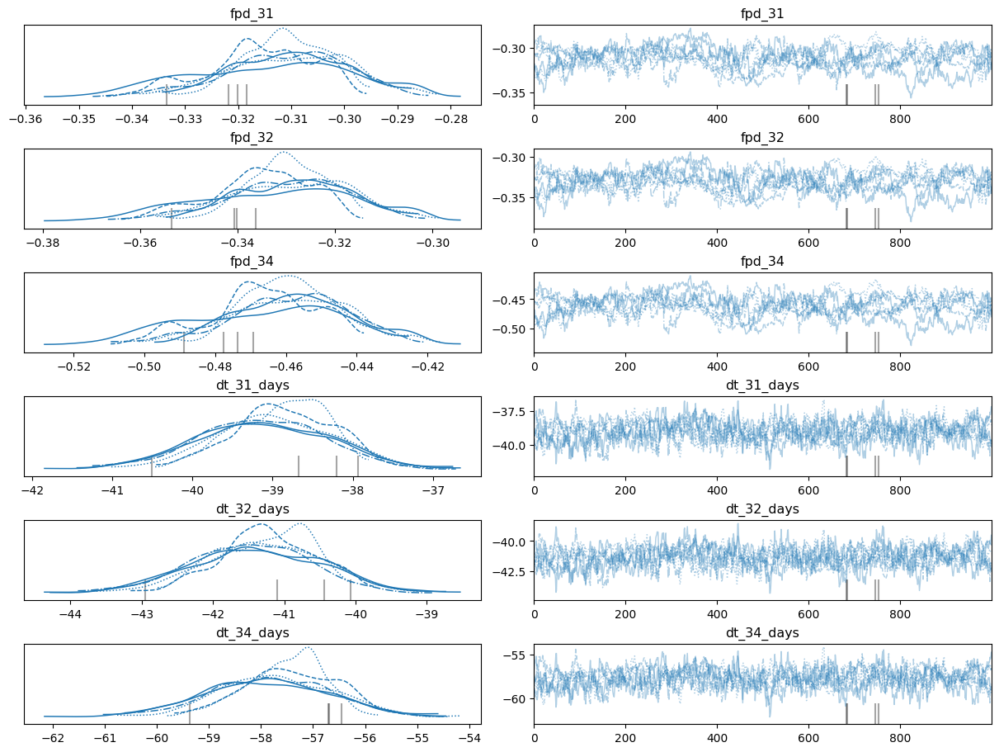

In [8]:
trace_delay_vars = [name for name in vars_delay if name in post.data_vars]
_ = az.plot_trace(
    inf_data_pixel,
    var_names=trace_delay_vars,
    figsize=(12, max(6, 1.5 * len(trace_delay_vars))),
)
plt.show()


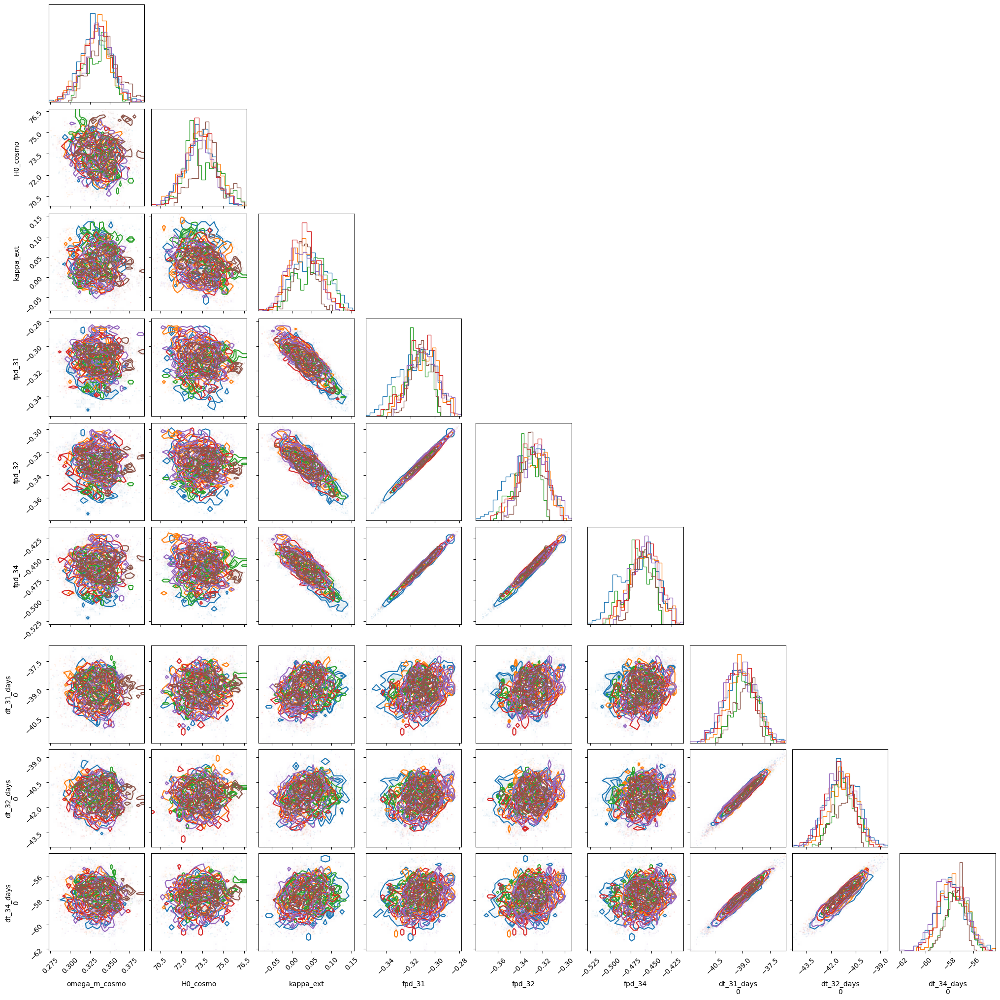

In [9]:
fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post.isel(chain=i),
        var_names=corner_vars_delay,
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()


In [10]:
for name in [n for n in vars_delay if n in post.data_vars]:
    vals = np.asarray(post[name].values, dtype=float)
    print(name, 'median by chain =', np.median(vals, axis=1))


fpd_31 median by chain = [-0.31383081 -0.30902595 -0.31576663 -0.31016973 -0.30921624 -0.31113128]
fpd_32 median by chain = [-0.3317894  -0.32770997 -0.33466404 -0.32903539 -0.32704202 -0.32989829]
fpd_34 median by chain = [-0.46422692 -0.45784609 -0.4664278  -0.45799155 -0.45723939 -0.46033112]
dt_31_days median by chain = [[-39.08806254]
 [-38.99924309]
 [-38.86850923]
 [-39.15472863]
 [-39.16460527]
 [-38.84909979]]
dt_32_days median by chain = [[-41.3576552 ]
 [-41.28660696]
 [-41.25689362]
 [-41.48866441]
 [-41.43747808]
 [-41.20265639]]
dt_34_days median by chain = [[-57.87739004]
 [-57.7210873 ]
 [-57.42964053]
 [-57.8054218 ]
 [-57.96221503]
 [-57.45555659]]


In [11]:
summary_vars = [
    name for name in (vars_mass + vars_power + vars_point_source + vars_cosmo + vars_delay)
    if name in post.data_vars
]
az.summary(post, var_names=summary_vars)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
m2l_ratio,0.669,0.116,0.446,0.873,0.013,0.006,78.0,137.0,1.06
m2l_ratio_slope,-0.335,0.058,-0.447,-0.237,0.009,0.003,45.0,180.0,1.08
kappa_s_halo,0.087,0.040,0.034,0.164,0.007,0.006,36.0,60.0,1.13
gammain_halo,1.397,0.085,1.230,1.559,0.017,0.012,24.0,43.0,1.18
e_halo[0],-0.067,0.003,-0.072,-0.063,0.000,0.000,52.0,176.0,1.08
e_halo[1],0.057,0.004,0.050,0.064,0.001,0.000,35.0,84.0,1.12
Rs_halo,8.427,3.383,3.171,15.002,0.507,0.258,48.0,96.0,1.11
center_halo[0],-0.005,0.004,-0.012,0.002,0.000,0.000,75.0,138.0,1.06
center_halo[1],-0.020,0.001,-0.022,-0.017,0.000,0.000,98.0,281.0,1.05
gamma_sheer_halo[0],-0.013,0.002,-0.017,-0.009,0.000,0.000,48.0,150.0,1.10


In [12]:
for i in range(num_chains):
    print(f'chain {i}')
    print(az.summary(post.isel(chain=[i]), var_names=[name for name in vars_cosmo + vars_delay if name in post.data_vars]))


chain 0


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.331  0.018   0.298    0.366      0.002    0.001      96.0   
H0_cosmo       73.265  1.018  71.384   75.218      0.102    0.050     100.0   
kappa_ext       0.047  0.043  -0.024    0.129      0.013    0.003      12.0   
fpd_31         -0.316  0.015  -0.342   -0.292      0.005    0.001      10.0   
fpd_32         -0.334  0.016  -0.360   -0.305      0.005    0.001      10.0   
fpd_34         -0.467  0.022  -0.505   -0.431      0.007    0.002      10.0   
dt_31_days[0] -39.076  0.836 -40.653  -37.580      0.103    0.040      65.0   
dt_32_days[0] -41.329  0.933 -42.967  -39.551      0.129    0.050      52.0   
dt_34_days[0] -57.869  1.196 -60.231  -55.832      0.123    0.056      94.0   

               ess_tail  r_hat  
omega_m_cosmo     187.0    NaN  
H0_cosmo          172.0    NaN  
kappa_ext         114.0    NaN  
fpd_31             88.0    NaN  
fpd_32             79.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.331  0.016   0.297    0.359      0.002    0.001      66.0   
H0_cosmo       73.340  1.093  71.457   75.527      0.151    0.069      53.0   
kappa_ext       0.032  0.037  -0.029    0.101      0.011    0.002      12.0   
fpd_31         -0.310  0.012  -0.330   -0.287      0.007    0.001       3.0   
fpd_32         -0.328  0.012  -0.353   -0.307      0.007    0.001       3.0   
fpd_34         -0.459  0.017  -0.494   -0.429      0.009    0.002       4.0   
dt_31_days[0] -38.969  0.739 -40.309  -37.610      0.172    0.041      17.0   
dt_32_days[0] -41.280  0.810 -42.739  -39.801      0.165    0.045      24.0   
dt_34_days[0] -57.676  1.066 -59.552  -55.722      0.257    0.059      16.0   

               ess_tail  r_hat  
omega_m_cosmo     156.0    NaN  
H0_cosmo          117.0    NaN  
kappa_ext         112.0    NaN  
fpd_31             34.0    NaN  
fpd_32             49.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.335  0.015   0.306    0.359      0.008    0.002       4.0   
H0_cosmo       73.435  1.158  71.709   75.946      0.892    0.147       2.0   
kappa_ext       0.052  0.038  -0.013    0.117      0.023    0.011       4.0   
fpd_31         -0.316  0.010  -0.335   -0.300      0.005    0.003       4.0   
fpd_32         -0.335  0.010  -0.355   -0.319      0.004    0.003       5.0   
fpd_34         -0.467  0.015  -0.496   -0.442      0.007    0.005       4.0   
dt_31_days[0] -38.856  0.614 -40.091  -37.859      0.131    0.055      22.0   
dt_32_days[0] -41.230  0.658 -42.477  -40.057      0.135    0.066      24.0   
dt_34_days[0] -57.407  0.880 -58.966  -55.784      0.182    0.066      24.0   

               ess_tail  r_hat  
omega_m_cosmo      24.0    NaN  
H0_cosmo           36.0    NaN  
kappa_ext          24.0    NaN  
fpd_31             17.0    NaN  
fpd_32             16.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.333  0.018   0.297    0.366      0.002    0.001     116.0   
H0_cosmo       73.322  0.981  71.581   75.246      0.130    0.059      60.0   
kappa_ext       0.032  0.036  -0.032    0.103      0.005    0.003      51.0   
fpd_31         -0.311  0.012  -0.334   -0.290      0.002    0.001      49.0   
fpd_32         -0.330  0.013  -0.356   -0.309      0.002    0.001      49.0   
fpd_34         -0.459  0.017  -0.494   -0.430      0.002    0.001      49.0   
dt_31_days[0] -39.149  0.766 -40.683  -37.793      0.080    0.043      90.0   
dt_32_days[0] -41.507  0.823 -42.854  -39.714      0.084    0.052      96.0   
dt_34_days[0] -57.803  1.105 -59.634  -55.499      0.114    0.055      92.0   

               ess_tail  r_hat  
omega_m_cosmo     195.0    NaN  
H0_cosmo           81.0    NaN  
kappa_ext         134.0    NaN  
fpd_31             86.0    NaN  
fpd_32             80.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.336  0.017   0.302    0.366      0.002    0.001      85.0   
H0_cosmo       73.215  1.086  71.191   75.298      0.127    0.049      74.0   
kappa_ext       0.026  0.036  -0.037    0.091      0.007    0.002      24.0   
fpd_31         -0.309  0.011  -0.327   -0.285      0.003    0.002      14.0   
fpd_32         -0.327  0.012  -0.347   -0.302      0.003    0.002      14.0   
fpd_34         -0.457  0.017  -0.484   -0.423      0.005    0.004      13.0   
dt_31_days[0] -39.138  0.844 -40.746  -37.631      0.115    0.044      54.0   
dt_32_days[0] -41.426  0.931 -43.198  -39.853      0.128    0.048      53.0   
dt_34_days[0] -57.922  1.226 -60.257  -55.755      0.166    0.063      55.0   

               ess_tail  r_hat  
omega_m_cosmo     137.0    NaN  
H0_cosmo          237.0    NaN  
kappa_ext         120.0    NaN  
fpd_31             22.0    NaN  
fpd_32             22.0    NaN  
fpd_34     

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
omega_m_cosmo   0.342  0.018   0.310    0.376      0.007    0.002       8.0   
H0_cosmo       73.883  1.019  72.076   76.076      0.371    0.188       8.0   
kappa_ext       0.031  0.025  -0.017    0.073      0.014    0.003       3.0   
fpd_31         -0.311  0.008  -0.324   -0.297      0.003    0.001       8.0   
fpd_32         -0.330  0.008  -0.344   -0.316      0.003    0.001       9.0   
fpd_34         -0.460  0.012  -0.479   -0.438      0.005    0.001       6.0   
dt_31_days[0] -38.914  0.549 -39.921  -37.999      0.136    0.038      14.0   
dt_32_days[0] -41.267  0.614 -42.305  -40.187      0.188    0.036      12.0   
dt_34_days[0] -57.537  0.727 -58.879  -56.230      0.128    0.061      33.0   

               ess_tail  r_hat  
omega_m_cosmo      48.0    NaN  
H0_cosmo           12.0    NaN  
kappa_ext          31.0    NaN  
fpd_31             15.0    NaN  
fpd_32             13.0    NaN  
fpd_34     